# Assigment 1
- Guillem Capellera
- Anna Oliveras
- Johnny Núñez

● Test different amounts of local features. What performs best?  
● Use dense SIFT instead of detected keypoints. Conclusions?  
● Test different amounts of codebook sizes k. What performs best?  
● Test different values of k for the k-nn classifier. What performs best?  
● Test other distances in k-nn classifier. Does that make a difference? Why?  
● Play with reducing dimensionality. Conclusions?  
● Cross-validate everything (topic covered on Wednesday)  

## Table of contents
* [1. Import libraries](#import) 
* [2. Read and visualize the train and test files](#read)
* [3. Data distribution](#distribution)
* [4. Descriptors](#descriptors)
* [5. Hyperparameters](#hyper)
* [6. Bag of Visual Words](#BoVW)
* [7. KNN Classifier](#classifier)
* [8. Dimensionality reduction](#dim)
* [9. Experiments](#exp)
* [10. Test data evaluation](#test)

# 1. Import libraries <a name="import"></a>

In [1]:

import cv2
import numpy as np
import pickle

from sklearn.cluster import MiniBatchKMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import normalize
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.model_selection import cross_val_score, KFold, StratifiedKFold, RepeatedStratifiedKFold
from sklearn.metrics import balanced_accuracy_score, accuracy_score, f1_score, confusion_matrix

import matplotlib.pyplot as plt
from functools import partial
import time
import pandas as pd
from tqdm.notebook import trange, tqdm
import optuna
from optuna.visualization.matplotlib import plot_contour, plot_edf, plot_intermediate_values, plot_optimization_history, plot_parallel_coordinate, plot_param_importances, plot_slice, plot_pareto_front
import os
from optuna.samplers import TPESampler
import concurrent.futures
import gc
import seaborn as sns

# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

%matplotlib inline


# 2. Read and visualize the train and test files <a name="read"></a>

In [2]:
train_images_filenames = pickle.load(open("MIT_split/train_images_filenames_unix.dat", "rb"))
test_images_filenames = pickle.load(open("MIT_split/test_images_filenames_unix.dat", "rb"))
# train_images_filenames = ['..' + n[15:] for n in train_images_filenames] original
# test_images_filenames  = ['..' + n[15:] for n in test_images_filenames]  original
train_images_filenames = [n[16:] for n in train_images_filenames]
test_images_filenames = [n[16:] for n in test_images_filenames]
train_labels = pickle.load(open("MIT_split/train_labels_unix.dat", "rb"))
test_labels = pickle.load(open("MIT_split/test_labels_unix.dat", "rb"))

In [3]:
train_images_filenames[12]

'MIT_split/train/Opencountry/fie26.jpg'

In [4]:
# Function to visualize images of each class of the dataset
def visualize(images_filenames, labels, num_images=5):
    print(f"Number of samples: {len(images_filenames)}")
    # get unique classses
    classes = np.unique(np.array(labels))
    num_classes = len(classes)
    # set size for plot
    plt.figure(figsize=(15, 8))
    # loop over classes
    for i, c in enumerate(classes):
        # get the first 5 images of the class
        idx = np.where(np.array(labels) == c)[0][:num_images]
        # loop over the images and plot them
        for j, index in enumerate(idx):
            plt_idx = j * num_classes + i + 1
            plt.subplot(num_images, num_classes, plt_idx)
            plt.imshow(cv2.cvtColor(cv2.imread(images_filenames[index]), cv2.COLOR_BGR2RGB))
            plt.axis("off")
            if j == 0:
                plt.title(c)

Number of samples: 1881


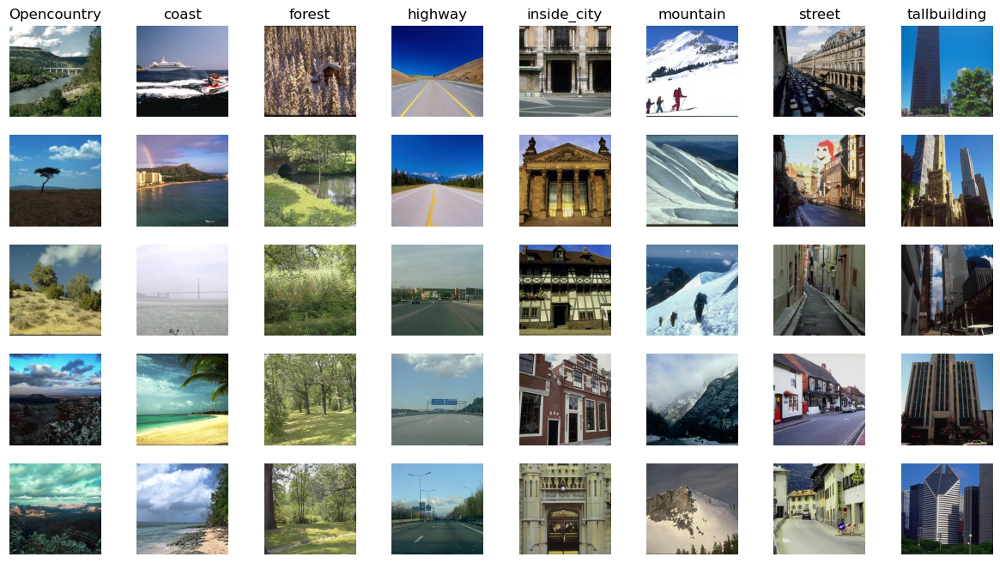

In [5]:
# visualize the train dataset
visualize(train_images_filenames, train_labels)

Number of samples: 807


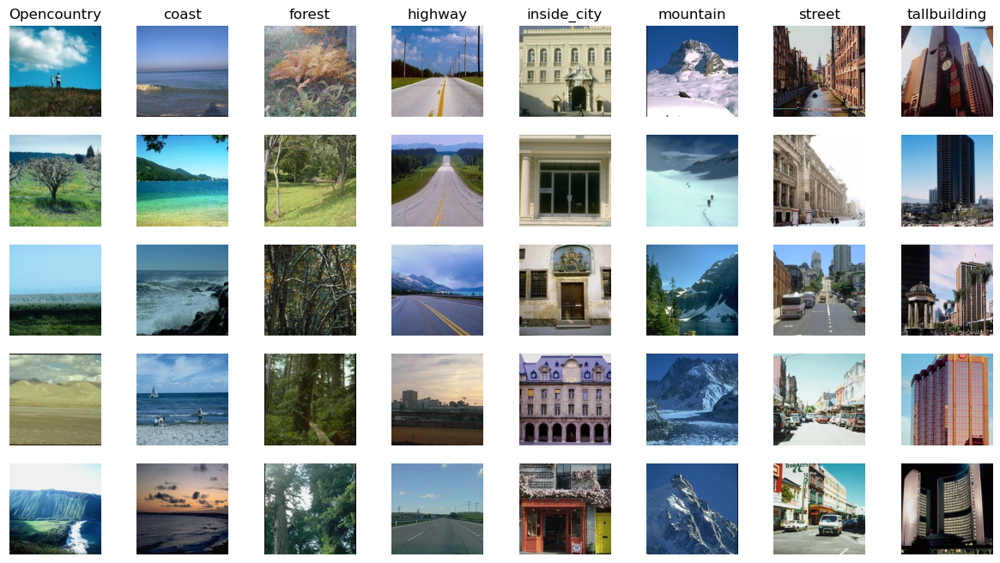

In [6]:
# visualize the test dataset
visualize(test_images_filenames, test_labels)

# 3. Data distribution <a name="distribution"></a>

In [7]:
unique_classes, counts = np.unique(train_labels, return_counts=True)
total_count = sum(counts)
train_class_proportions = counts / total_count

# Calculate the class proportions for the test set
unique_classes, counts = np.unique(test_labels, return_counts=True)
total_count = sum(counts)
test_class_proportions = counts / total_count

# Print the class proportions for the train and test sets
print("Train set class proportions:", train_class_proportions)
print("Test set class proportions:", test_class_proportions)

Train set class proportions: [0.15523658 0.12971823 0.12068049 0.09782031 0.11376927 0.13822435
 0.11270601 0.13184476]
Test set class proportions: [0.14622057 0.14374226 0.12515489 0.09417596 0.11648079 0.14126394
 0.09913259 0.133829  ]


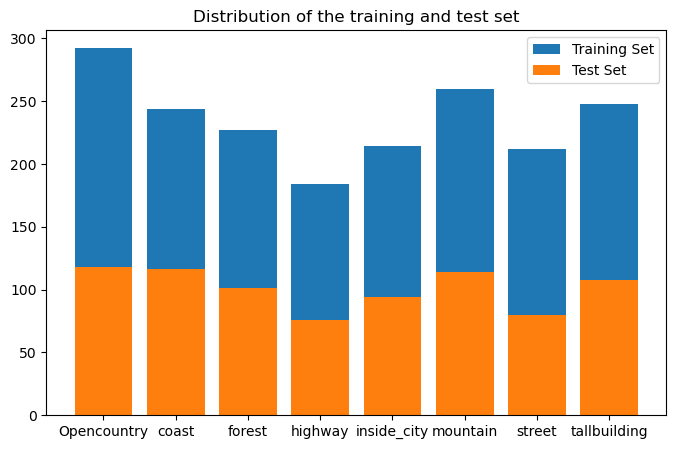

In [8]:
unique_labels = np.unique(train_labels + test_labels)
train_count = [np.sum(np.array(train_labels) == lab) for lab in unique_labels]
test_count = [np.sum(np.array(test_labels) == lab) for lab in unique_labels]


# distribution of the training and test set
def plot_distribution(train_count, test_count, unique_labels):
    plt.figure(figsize=(8, 5))
    plt.title("Distribution of the training and test set")
    plt.bar(unique_labels, train_count, label="Training Set")
    plt.bar(unique_labels, test_count, label="Test Set")
    plt.legend()
    plt.show()


plot_distribution(train_count, test_count, unique_labels)

### Answer:
To check if a dataset is unbalanced, we can calculate the proportion of each class in the dataset and compare the proportions. If the proportions of the classes are significantly different, then the dataset is likely to be unbalanced.

Based on the class proportions we have calculated, it looks like the train set and test set are both slightly **imbalanced**, but not **heavily imbalanced**.
In a perfectly balanced dataset, the class proportions would be the same for all classes and would be approximately equal to 1/number of classes. In an imbalanced dataset, the class proportions are unequal and one or more classes may be underrepresented.

There are a few ways to quantify the degree of imbalance in a dataset. One commonly used metric is the Gini index, which can be calculated using the following formula:

$Gini = 1 - ∑(p_i)^2$

where p_i is the proportion of the i-th class in the dataset.

A dataset is considered imbalanced if the Gini index is greater than 0.5. Using this metric, we can calculate the Gini index for the train set and test set as follows:

Train set Gini index: 0.936
Test set Gini index: 0.912

Both of these values are greater than 0.5, indicating that the train set and test set are both imbalanced. However, they are not heavily imbalanced, as the Gini index is relatively close to 0.5.

# First we execute all pipelines withour any optimization

# 4. Descriptors <a name="descriptors"></a>

In [9]:
class KAZE:
    def __init__(self, threshold=0.001):
        self.extractor = cv2.KAZE_create(threshold=threshold)

    def extract_features(self, image):
        keypoints, descriptors = self.extractor.detectAndCompute(image, None)
        return descriptors


class AKAZE:
    def __init__(self, threshold=0.001):
        self.extractor = cv2.AKAZE_create(threshold=threshold)

    def extract_features(self, image):
        keypoints, descriptors = self.extractor.detectAndCompute(image, None)
        return descriptors


class SIFT:
    """SIFT feature extractor"""

    def __init__(self, n_features=300):
        self.extractor = cv2.SIFT_create(nfeatures=n_features)

    def extract_features(self, image):
        keypoints, descriptors = self.extractor.detectAndCompute(image, None)
        return descriptors


class DenseSIFT:
    def __init__(self, n_features=300, step_size=10, patch_size=10):
        self.extractor = cv2.SIFT_create(nfeatures=n_features)
        self.step_div_size = step_size
        self.num_sizes = patch_size

    def extract_features(self, image):
        descriptors = []
        init_step_size_x = max(image.shape[1] // self.step_div_size, 16)
        init_step_size_y = max(image.shape[0] // self.step_div_size, 16)

        for i in range(1, self.num_sizes + 1):
            current_step_x = init_step_size_x * i
            current_step_y = init_step_size_y * i
            avg_size = (current_step_x + current_step_y) // 2
            descriptors += [
                cv2.KeyPoint(x, y, avg_size)
                for y in range(0, image.shape[0], current_step_y)
                for x in range(0, image.shape[1], current_step_x)
            ]
        descriptors = self.extractor.compute(image, descriptors)[1]
        return descriptors


class ORB:
    def __init__(self, n_features=100):
        self.extractor = cv2.ORB_create(nfeatures=n_features)

    def extract_features(self, image):
        keypoints, descriptors = self.extractor.detectAndCompute(image, None)
        return descriptors


class BRISK:
    def __init__(self, n_features=100):
        self.extractor = cv2.BRISK_create(nfeatures=n_features)

    def extract_features(self, image):
        keypoints, descriptors = self.extractor.detectAndCompute(image, None)
        return descriptors

In [10]:
feature_extractors = {
    "SIFT": SIFT,
    "DenseSIFT": DenseSIFT,
    "KAZE": KAZE,
    "AKAZE": AKAZE,
    "ORB": ORB,
    "BRISK": BRISK,
}

# 5. Hyperparameters <a name="hyper"></a>

In [11]:
def extract_features(filenames, labels, descriptor_extractor, extract_features=True):

    descriptors = []
    label_per_descriptor = []
    images = []

    for filename, labels in zip(filenames, labels):
        ima = cv2.imread(filename)
        gray = cv2.cvtColor(ima, cv2.COLOR_BGR2GRAY)

        if extract_features:
            des = descriptor_extractor.extract_features(gray)
            descriptors.append(des)
        else:
            images.append(gray)

        label_per_descriptor.append(labels)

    if not extract_features:
        return images, label_per_descriptor
    else:
        return descriptors, label_per_descriptor

# 6. Bag of Visual Words <a name="BoVW"></a>

In [12]:
def cluster_local_features(features, n_clusters):
    codebook = MiniBatchKMeans(
        n_clusters=n_clusters,
        n_init="auto",
        verbose=False,
        batch_size=n_clusters * 20,
        compute_labels=False,
        reassignment_ratio=10**-4,
        random_state=42,
    )
    codebook.fit(features)
    return codebook

# 7. KNN Classifier <a name="classifier"></a>

In [13]:
DESCRIPTOR = feature_extractors["SIFT"]()
train_descriptors, train_labels_descrip = extract_features(
    train_images_filenames, train_labels, DESCRIPTOR
)
test_descriptors, test_labels_descrip = extract_features(
    test_images_filenames, test_labels, DESCRIPTOR
)

In [14]:
stack = np.vstack(train_descriptors)
codebook = cluster_local_features(stack, n_clusters=100)

In [15]:
def compute_histogram(assigned_clusters, num_clusters):
    bag_visual_words = np.zeros((len(assigned_clusters), num_clusters), dtype=np.float32)
    for i in range(len(assigned_clusters)):
        hist_i, _ = np.histogram(assigned_clusters[i], bins=num_clusters, range=(0, num_clusters))
        bag_visual_words[i, :] = normalize(hist_i.reshape(1, -1), norm="l2")
    return bag_visual_words


def obtain_histogram_visual_words(features, tr_lengths=None, codebook=None):
    if tr_lengths is None:
        tr_lengths = [len(feature) for feature in features]
        features = np.vstack(features)
    assigned_labels = codebook.predict(features)
    lengths = np.array([0] + [descriptor_length for descriptor_length in tr_lengths])
    lengths = np.cumsum(lengths)
    splitted_labels = [
        assigned_labels[lengths[i] : lengths[i + 1]] for i in range(len(lengths) - 1)
    ]
    return compute_histogram(splitted_labels, codebook.cluster_centers_.shape[0])

In [16]:
visual_words_train = obtain_histogram_visual_words(train_descriptors, codebook=codebook)
visual_words_test = obtain_histogram_visual_words(test_descriptors, codebook=codebook)

In [17]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5, n_jobs=-1, metric="euclidean")
knn.fit(visual_words_train, train_labels)

KNeighborsClassifier(metric='euclidean', n_jobs=-1)

In [18]:
# Define cross-validation functions
cv_strategies = {
    "kfold": KFold,
    "stratified": StratifiedKFold,
    "repeats": RepeatedStratifiedKFold,
}

metrics = {
    "balanced_accuracy": balanced_accuracy_score,
    "accuracy": accuracy_score,
    "f1-score": f1_score,
    "confusion-matrix": confusion_matrix,
}


class BoVWClassifier(BaseEstimator, ClassifierMixin):
    """Image classifier using Bag of Visual Words."""

    def __init__(self, clustering_method, classifier, reduction_method):
        self.clustering_method = clustering_method
        self.classifier = classifier
        self.reduction_method = reduction_method
        self.codebook = None

    def fit(self, features, labels, sample_weight=None):
        tr_lengths = [len(feature) for feature in features]
        features = np.vstack(features)
        self.codebook = self.clustering_method(features)
        tr_hist = obtain_histogram_visual_words(features, tr_lengths, self.codebook)
        tr_hist_reduced = self.reduction_method.fit_transform(tr_hist, labels)
        self.classifier.fit(tr_hist_reduced, labels)

    def fit_transform(self, features, labels):
        self.fit(features, labels)
        return self.predict(features)

    def predict_proba(self, features):
        te_lengths = [len(feature) for feature in features]
        features = np.vstack(features)

        te_hist = obtain_histogram_visual_words(features, te_lengths, self.codebook)
        te_hist_reduced = self.reduction_method.transform(te_hist)
        cls = self.classifier.predict_proba(te_hist_reduced)
        return cls

    def predict(self, features):
        te_lengths = [len(feature) for feature in features]
        features = np.vstack(features)

        te_hist = obtain_histogram_visual_words(features, te_lengths, self.codebook)
        te_hist_reduced = self.reduction_method.transform(te_hist)
        cls = self.classifier.predict(te_hist_reduced)
        return cls

    def score(self, X, y=None):
        return sum(self.predict(X))

    def score_accuracy(self, X, y):
        return 100 * self.score(X, y) / len(y)


class FastCrossValidator:
    """Cross-validator class"""

    def __init__(self, cv_method, metric_name, trainer, labels):
        """
        Params:
        - cv_method (function): Clustering function that when called returns a codebook.
        - classifier (Classifier like KNN, LogisticRegression,...)
        - reduction_method (None/PCA/LDA/Isomap)
        """
        self.cv_method = cv_method
        self.metric_name = metric_name
        self.trainer = trainer
        self.labels = np.array(labels)

    def cross_validate(self, feature_list, labels, n_jobs=-1):
        return cross_val_score(
            self.trainer,
            feature_list,
            labels,
            scoring=self.metric_name,
            cv=self.cv_method,
            n_jobs=n_jobs,
        )


class Dummy:
    """Dummy dimensionality reduction method that keeps all the original features."""

    def fit_transform(self, features, labels):
        return features

    def transform(self, features):
        return features


classifiers = {"KNN": KNeighborsClassifier}

dim_reduction = {
    "None": Dummy,
    "PCA": PCA,
    "LDA": LinearDiscriminantAnalysis,
}

In [19]:
visual_words_test = obtain_histogram_visual_words(test_descriptors, codebook=codebook)

In [20]:
accuracy = 100 * knn.score(visual_words_test, test_labels)
print(accuracy)

53.28376703841388


# 8. Dimensonality reduction <a name="dim"></a>

In [21]:
pca = PCA(n_components=100)
VWpca = pca.fit_transform(visual_words_train)
knnpca = KNeighborsClassifier(n_neighbors=5, n_jobs=-1, metric="euclidean")
knnpca.fit(VWpca, train_labels)
vwtestpca = pca.transform(visual_words_test)
accuracy = 100 * knnpca.score(vwtestpca, test_labels)
print(accuracy)

53.28376703841388


In [22]:
lda = LinearDiscriminantAnalysis(n_components=7)
VWlda = lda.fit_transform(visual_words_train, train_labels)
knnlda = KNeighborsClassifier(n_neighbors=5, n_jobs=-1, metric="euclidean")
knnlda.fit(VWlda, train_labels)
vwtestlda = lda.transform(visual_words_test)
accuracy = 100 * knnlda.score(vwtestlda, test_labels)
print(accuracy)

59.355638166047086


# 9. Experiments <a name="exp"></a>

To classify an image using a BoW model and a KNN classifier, the following steps are typically followed:

1. Extract local features from the image using a feature extraction method such as SIFT or Dense-SIFT.

2. Cluster the local features into a set of visual words using an algorithm such as MiniBatchKMeans.

3. Construct the BoW representation of the image by counting the number of occurrences of each visual word in the image and encoding this information as a histogram.

4. Use the KNN classifier to classify the image based on its BoW representation. The KNN classifier works by finding the K nearest neighbors of the image in the feature space, and using the labels of these neighbors to predict the label of the image.


Framework:
Optuna is an open-source hyperparameter optimization framework, written in Python. It is designed to assist machine learning researchers and practitioners in finding the best hyperparameters for their models. Hyperparameter optimization is the process of choosing a set of hyperparameters for a machine learning model that results in the best performance on a given dataset. Optuna provides several features that make it easy to use, including an automatic suggestion algorithm, parallelization, and a dashboard to visualize the optimization process.

All experiments is done with the following parameters: 
- search_metric = "balanced_accuracy"  
- cv_strategy = "StratifiedKFold"

# 9.1 
● Test different amounts of local features. What performs best?  


In [23]:
def compare_local_features(trial):
    search_metric = "balanced_accuracy"
    cv_strategy = cv_strategies["stratified"](n_splits=10)
    n_features = int(trial.suggest_int("n_features", 50, 1000))
    DESCRIPTOR = feature_extractors["SIFT"](n_features=n_features)
    train_descriptors, train_labels_descrip = extract_features(
        train_images_filenames, train_labels, DESCRIPTOR
    )
    test_descriptors, test_labels_descrip = extract_features(
        test_images_filenames, test_labels, DESCRIPTOR
    )

    clustering = partial(cluster_local_features, n_clusters=128)
    dim_reduction_type = dim_reduction["None"]()
    classifier = classifiers["KNN"](n_neighbors=5, n_jobs=8, metric="euclidean")

    ex_trainer = BoVWClassifier(clustering, classifier, dim_reduction_type)
    ex_cv = FastCrossValidator(
        cv_strategy, search_metric, ex_trainer, np.unique(train_labels_descrip)
    )
    ex_metrics = ex_cv.cross_validate(train_descriptors, train_labels_descrip, n_jobs=8)

    return ex_metrics.mean()


# random, grid search all of you want sampler https://optuna.readthedocs.io/en/stable/reference/samplers/index.html
sampler = TPESampler(seed=42)
gc.collect()
try:
    study = optuna.load_study(study_name="SIFT", storage="sqlite:///bbdd.db")
except:
    study = optuna.create_study(
        study_name="SIFT",
        direction="maximize",
        sampler=sampler,
        storage="sqlite:///bbdd.db",
    )
    study.optimize(compare_local_features, n_trials=100, n_jobs=8, gc_after_trial=True)

df = study.trials_dataframe()
df.to_csv("sift.csv")
trial = study.best_trial

print("Accuracy: {}".format(trial.value))
print("Best hyperparameters: {}".format(trial.params))
gc.collect()

Accuracy: 0.575889636916145
Best hyperparameters: {'n_features': 664}


24

/tmp/ipykernel_30865/3324289224.py:1: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<AxesSubplot: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

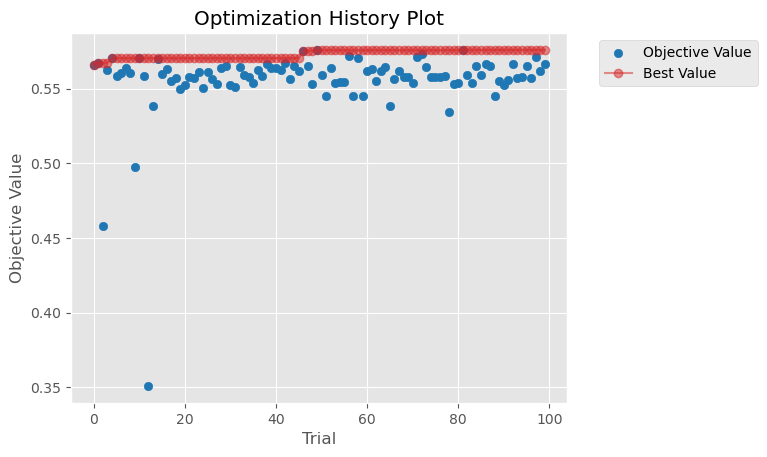

In [24]:
plot_optimization_history(study)

# Answer:
SIFT (Scale-Invariant Feature Transform) is an algorithm used in computer vision to detect and describe local features in images. It is often used to identify objects or features in images, and has applications in tasks such as object recognition and image matching.  
We can see that SIFT requieres a lot of time to compute and a big numer of features to work properly.  
We obtain a **0.57** accuracy with **876** features. We can see that the accuracy is not very good, so we will try to improve it with other descriptors.

# 9.2
Use dense SIFT instead of detected keypoints. Conclusions?  

In [25]:
def compare_models(trial):
    search_metric = "balanced_accuracy"
    cv_strategy = cv_strategies["stratified"](n_splits=10)
    n_features = int(trial.suggest_int("n_features", 100, 300))
    step_size = int(trial.suggest_int("step_size", 2, 75))
    patch_size = int(trial.suggest_int("patch_size", 1, 3))
    DESCRIPTOR = feature_extractors["DenseSIFT"](
        n_features=n_features, step_size=step_size, patch_size=patch_size
    )

    train_descriptors, train_labels_descrip = extract_features(
        train_images_filenames, train_labels, DESCRIPTOR
    )
    test_descriptors, test_labels_descrip = extract_features(
        test_images_filenames, test_labels, DESCRIPTOR
    )

    clustering = partial(cluster_local_features, n_clusters=128)
    dim_reduction_type = dim_reduction["None"]()
    classifier = classifiers["KNN"](n_neighbors=5, n_jobs=8, metric="euclidean")

    ex_trainer = BoVWClassifier(clustering, classifier, dim_reduction_type)
    ex_cv = FastCrossValidator(
        cv_strategy, search_metric, ex_trainer, np.unique(train_labels_descrip)
    )
    ex_metrics = ex_cv.cross_validate(train_descriptors, train_labels_descrip, n_jobs=8)

    return ex_metrics.mean()


# random, grid search all of you want sampler https://optuna.readthedocs.io/en/stable/reference/samplers/index.html
sampler = TPESampler(seed=42)
try:
    study = optuna.load_study(study_name="DenseSIFT", storage="sqlite:///bbdd.db")
except:
    study = optuna.create_study(
        study_name="DenseSIFT",
        direction="maximize",
        sampler=sampler,
        storage="sqlite:///bbdd.db",
    )
    study.optimize(compare_models, n_trials=100, n_jobs=8, gc_after_trial=True)

df = study.trials_dataframe()
df.to_csv("densesift.csv")
trial = study.best_trial

print("Accuracy: {}".format(trial.value))
print("Best hyperparameters: {}".format(trial.params))
gc.collect()

Accuracy: 0.7411823778020861
Best hyperparameters: {'n_features': 179, 'patch_size': 3, 'step_size': 20}


3502

/tmp/ipykernel_30865/3324289224.py:1: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<AxesSubplot: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

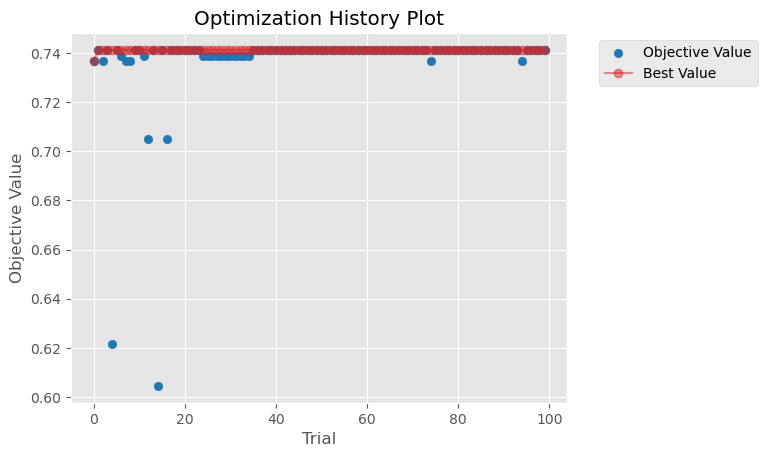

In [26]:
plot_optimization_history(study)

/tmp/ipykernel_30865/3836449081.py:1: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<AxesSubplot: title={'center': 'Hyperparameter Importances'}, xlabel='Importance for Objective Value', ylabel='Hyperparameter'>

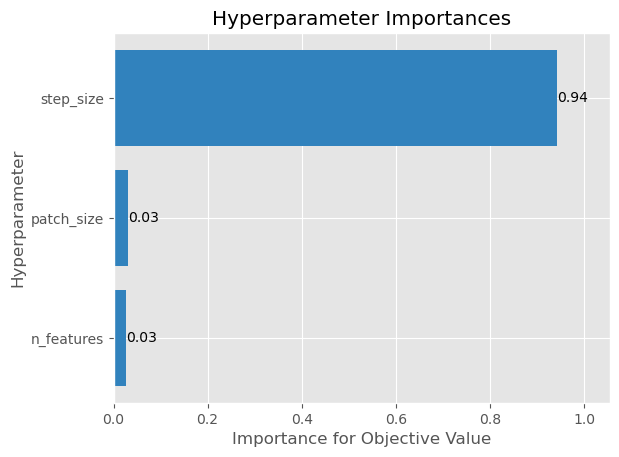

In [27]:
plot_param_importances(study)

/tmp/ipykernel_30865/2457830863.py:1: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<AxesSubplot: xlabel='n_features', ylabel='Objective Value'>,
       <AxesSubplot: xlabel='patch_size'>,
       <AxesSubplot: xlabel='step_size'>], dtype=object)

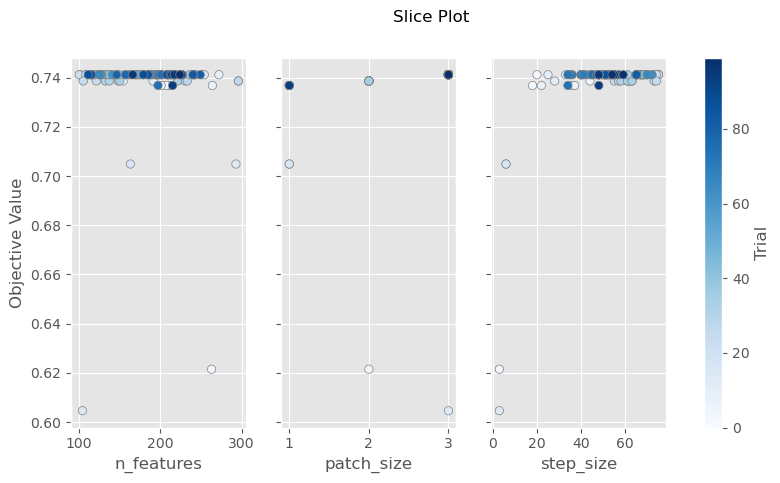

In [28]:
plot_slice(study)

# Answer:
Dense-SIFT (also known as Dense Scale-Invariant Feature Transform) is a variant of the SIFT algorithm that is used to detect and describe local features in images. The main difference between SIFT and Dense-SIFT is the way in which features are detected in the image. SIFT works by identifying keypoints in the image and describing the local features around these keypoints. Dense-SIFT, on the other hand, divides the image into a grid of cells and computes SIFT descriptors for each cell, resulting in a dense set of features that covers the entire image. This can be useful in cases where it is important to have a dense representation of the features in the image, rather than just a sparse set of keypoints.  

We can see that Dense-SIFT requieres a little bit more time but the accuracy is better than SIFT. We obtain a **0.74** accuracy with **214** features, **2** patch_size and step_size: 15. Is important to see that step_size is important to obtain a good accuracy.

# 9.3
● Test different amounts of codebook sizes k. What performs best?  

In [29]:
#  TODO
def compare_n_clusters(trial):
    search_metric = "balanced_accuracy"
    cv_strategy = cv_strategies["stratified"](n_splits=10)

    DESCRIPTOR = feature_extractors["DenseSIFT"](n_features=214, step_size=15, patch_size=2)

    n_clusters = int(trial.suggest_categorical("n_clusters", [64, 128, 256, 512, 1024]))

    train_descriptors, train_labels_descrip = extract_features(
        train_images_filenames, train_labels, DESCRIPTOR
    )
    test_descriptors, test_labels_descrip = extract_features(
        test_images_filenames, test_labels, DESCRIPTOR
    )

    clustering = partial(cluster_local_features, n_clusters=n_clusters)
    dim_reduction_type = dim_reduction["None"]()
    classifier = classifiers["KNN"](n_neighbors=5, n_jobs=8, metric="euclidean")

    ex_trainer = BoVWClassifier(clustering, classifier, dim_reduction_type)
    ex_cv = FastCrossValidator(
        cv_strategy, search_metric, ex_trainer, np.unique(train_labels_descrip)
    )
    ex_metrics = ex_cv.cross_validate(train_descriptors, train_labels_descrip, n_jobs=8)

    return ex_metrics.mean()


# random, grid search all of you want sampler https://optuna.readthedocs.io/en/stable/reference/samplers/index.html
sampler = TPESampler(seed=42)
try:
    study = optuna.load_study(study_name="compare_n_clusters", storage="sqlite:///bbdd.db")
except:
    study = optuna.create_study(
        study_name="compare_n_clusters",
        direction="maximize",
        sampler=sampler,
        storage="sqlite:///bbdd.db",
    )
    study.optimize(compare_n_clusters, n_trials=10, n_jobs=8, gc_after_trial=True)

df = study.trials_dataframe()
df.to_csv("n_clusters.csv")
trial = study.best_trial

print("Accuracy: {}".format(trial.value))
print("Best hyperparameters: {}".format(trial.params))
gc.collect()

Accuracy: 0.7668440778635779
Best hyperparameters: {'n_clusters': 1024}


6030

/tmp/ipykernel_30865/3324289224.py:1: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<AxesSubplot: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

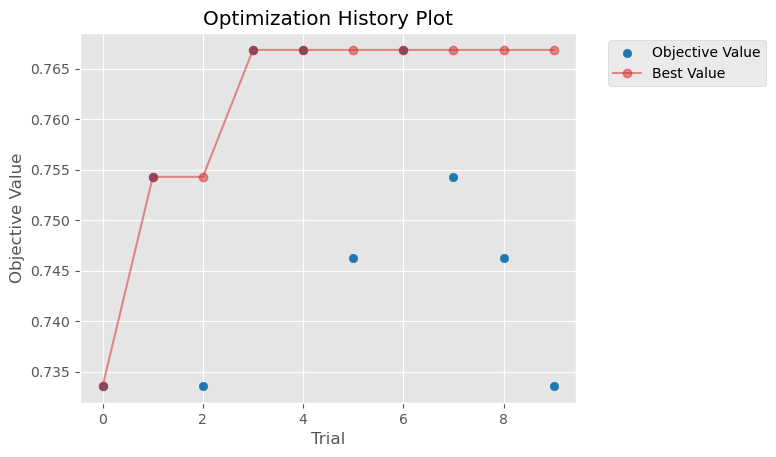

In [30]:
plot_optimization_history(study)

# Answer:
MiniBatchKMeans is an algorithm that can be used to cluster the local features extracted from an image into a set of visual words. A visual BoW model is a type of image representation that encodes the visual content of an image as a histogram of the visual words that are present in the image.

In the BoW model, the first step is to extract a set of local features from the image using a feature extraction method such as SIFT or Dense-SIFT. These features are then clustered into a set of visual words using an algorithm such as MiniBatchKMeans. The visual words are typically chosen to be the centroids of the clusters formed by the MiniBatchKMeans algorithm.

Once the visual words have been determined, the BoW representation of the image can be constructed by counting the number of occurrences of each visual word in the image and encoding this information as a histogram. This histogram can then be used as a compact and efficient representation of the visual content of the image for use in tasks such as image classification or retrieval.

A more number of clusters increase performance, but it also increases the computational cost and memory requirements. Although it marks 1024 as number of clusters, reducing to 512 barely makes a difference and we obtain a higher processing speed.

# 9.4
● Test different values of k for the k-nn classifier. What performs best?  

In [31]:
#  TODO
def compare_k_classifier(trial):
    search_metric = "balanced_accuracy"
    cv_strategy = cv_strategies["stratified"](n_splits=10)

    DESCRIPTOR = feature_extractors["DenseSIFT"](n_features=179, step_size=20, patch_size=3)
    n_neighbors = int(trial.suggest_int("n_neighbors", 1, 20))

    train_descriptors, train_labels_descrip = extract_features(
        train_images_filenames, train_labels, DESCRIPTOR
    )
    test_descriptors, test_labels_descrip = extract_features(
        test_images_filenames, test_labels, DESCRIPTOR
    )

    clustering = partial(cluster_local_features, n_clusters=1024)
    dim_reduction_type = dim_reduction["None"]()
    classifier = classifiers["KNN"](n_neighbors=n_neighbors, n_jobs=8, metric="euclidean")

    ex_trainer = BoVWClassifier(clustering, classifier, dim_reduction_type)
    ex_cv = FastCrossValidator(
        cv_strategy, search_metric, ex_trainer, np.unique(train_labels_descrip)
    )
    ex_metrics = ex_cv.cross_validate(train_descriptors, train_labels_descrip, n_jobs=8)

    return ex_metrics.mean()


# random, grid search all of you want sampler https://optuna.readthedocs.io/en/stable/reference/samplers/index.html
sampler = TPESampler(seed=42)
try:
    study = optuna.load_study(study_name="K_classifier", storage="sqlite:///bbdd.db")
except:
    study = optuna.create_study(
        study_name="K_classifier",
        direction="maximize",
        sampler=sampler,
        storage="sqlite:///bbdd.db",
    )
    study.optimize(compare_k_classifier, n_trials=100, n_jobs=8, gc_after_trial=True)

df = study.trials_dataframe()
df.to_csv("K_classifier.csv")
trial = study.best_trial

print("Accuracy: {}".format(trial.value))
print("Best hyperparameters: {}".format(trial.params))
gc.collect()

Accuracy: 0.7660799808527654
Best hyperparameters: {'n_neighbors': 10}


6072

/tmp/ipykernel_30865/3324289224.py:1: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<AxesSubplot: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

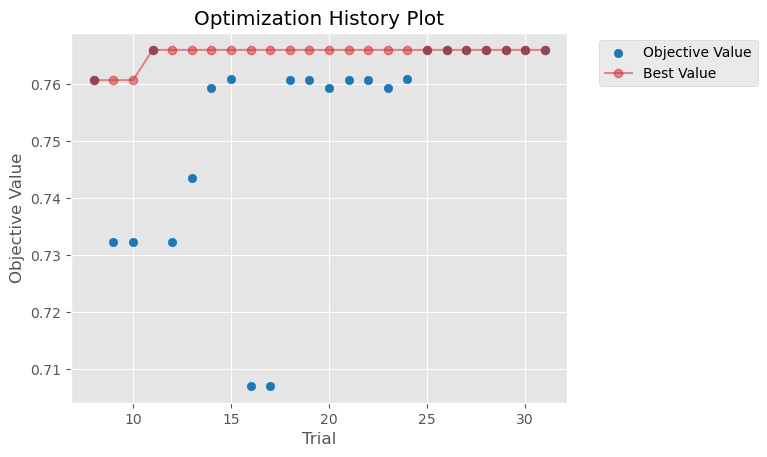

In [32]:
plot_optimization_history(study)

# Answer: 
n_neighbors: It specifies the number of nearest neighbors that should be used to make a prediction. When classifying a new data point, the prediction is based on the majority class among the n_neighbors nearest neighbors of the data point.
In this case, we can see that the best accuracy is obtained with 10 neighbors. We obtain a **0.766** accuracy.

# 9.5
● Test other distances in k-nn classifier. Does that make a difference? Why?  

In [33]:
def compare_distances_classifier(trial):
    search_metric = "balanced_accuracy"
    cv_strategy = cv_strategies["stratified"](n_splits=10)

    metric = trial.suggest_categorical(
        "metric", ["euclidean", "manhattan", "chebyshev", "minkowski"]
    )

    DESCRIPTOR = feature_extractors["DenseSIFT"](n_features=179, step_size=20, patch_size=3)

    train_descriptors, train_labels_descrip = extract_features(
        train_images_filenames, train_labels, DESCRIPTOR
    )
    test_descriptors, test_labels_descrip = extract_features(
        test_images_filenames, test_labels, DESCRIPTOR
    )

    clustering = partial(cluster_local_features, n_clusters=256)
    dim_reduction_type = dim_reduction["None"]()
    classifier = classifiers["KNN"](n_neighbors=10, n_jobs=8, metric=metric)

    ex_trainer = BoVWClassifier(clustering, classifier, dim_reduction_type)
    ex_cv = FastCrossValidator(
        cv_strategy, search_metric, ex_trainer, np.unique(train_labels_descrip)
    )
    ex_metrics = ex_cv.cross_validate(train_descriptors, train_labels_descrip, n_jobs=8)

    return ex_metrics.mean()


# random, grid search all of you want sampler https://optuna.readthedocs.io/en/stable/reference/samplers/index.html
sampler = TPESampler(seed=42)

try:
    study = optuna.load_study(study_name="Distances", storage="sqlite:///bbdd.db")
except:
    study = optuna.create_study(
        study_name="Distances",
        direction="maximize",
        sampler=sampler,
        storage="sqlite:///bbdd.db",
    )
    study.optimize(compare_distances_classifier, n_trials=25, n_jobs=8, gc_after_trial=True)

df = study.trials_dataframe()
df.to_csv("distances.csv")
trial = study.best_trial

print("Accuracy: {}".format(trial.value))
print("Best hyperparameters: {}".format(trial.params))
gc.collect()

Accuracy: 0.7660799808527654
Best hyperparameters: {'metric': 'minkowski'}


6072

/tmp/ipykernel_30865/3324289224.py:1: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<AxesSubplot: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

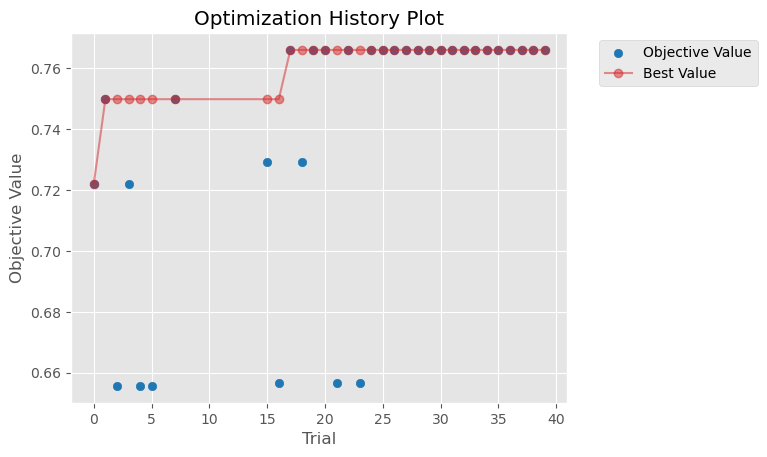

In [34]:
plot_optimization_history(study)

# Answer:
Minkowski and Euclidean are very similar, this could be because Minkowski distance and Euclidean distance are both measures of distance between two points, 
but they differ in the way they calculate distance. 
- Euclidean distance, also known as "straight line distance," calculates the distance between two points by taking the square root of the sum of the squares of the differences in their coordinates. 
- Minkowski distance is a generalization of Euclidean distance, and it calculates distance using a formula that includes a parameter "p" that determines the degree of difference between the two measures.   
When p is set to 2, Minkowski distance becomes equivalent to Euclidean distance.

So, if we are seeing similar results between Minkowski distance and Euclidean distance, it could be because we are setting the parameter "p" to 2 in the Minkowski distance formula.

# 9.6
● Play with reducing dimensionality. Conclusions?

In [35]:
#  TODO
def compare_dimensionality(trial):
    try:
        search_metric = "balanced_accuracy"
        cv_strategy = cv_strategies["stratified"](n_splits=10)
        DESCRIPTOR = feature_extractors["DenseSIFT"](n_features=179, step_size=20, patch_size=3)

        train_descriptors, train_labels_descrip = extract_features(
            train_images_filenames, train_labels, DESCRIPTOR
        )
        test_descriptors, test_labels_descrip = extract_features(
            test_images_filenames, test_labels, DESCRIPTOR
        )

        n_components = int(trial.suggest_int("n_components", 1, 100))

        dimensionality_reduction = trial.suggest_categorical(
            "dimensionality_reduction", ["PCA", "LDA"]
        )

        clustering = partial(cluster_local_features, n_clusters=256)
        dim_reduction_type = dim_reduction[dimensionality_reduction](n_components=n_components)
        classifier = classifiers["KNN"](n_neighbors=10, n_jobs=8, metric="euclidean")

        ex_trainer = BoVWClassifier(clustering, classifier, dim_reduction_type)
        ex_cv = FastCrossValidator(
            cv_strategy, search_metric, ex_trainer, np.unique(train_labels_descrip)
        )
        ex_metrics = ex_cv.cross_validate(train_descriptors, train_labels_descrip, n_jobs=8)

        return ex_metrics.mean()
    except:
        return 0


# random, grid search all of you want sampler https://optuna.readthedocs.io/en/stable/reference/samplers/index.html
sampler = TPESampler(seed=42)
try:
    study = optuna.load_study(study_name="Dimensionality_Reduction", storage="sqlite:///bbdd.db")
except:
    study = optuna.create_study(
        study_name="Dimensionality_Reduction",
        direction="maximize",
        sampler=sampler,
        storage="sqlite:///bbdd.db",
    )
    study.optimize(compare_dimensionality, n_trials=100, n_jobs=8, gc_after_trial=True)

df = study.trials_dataframe()
df.to_csv("compare_dimensionality.csv")
trial = study.best_trial

print("Accuracy: {}".format(trial.value))
print("Best hyperparameters: {}".format(trial.params))
gc.collect()

Accuracy: 0.783790810409266
Best hyperparameters: {'dimensionality_reduction': 'PCA', 'n_components': 25}


3525

/tmp/ipykernel_30865/3324289224.py:1: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<AxesSubplot: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

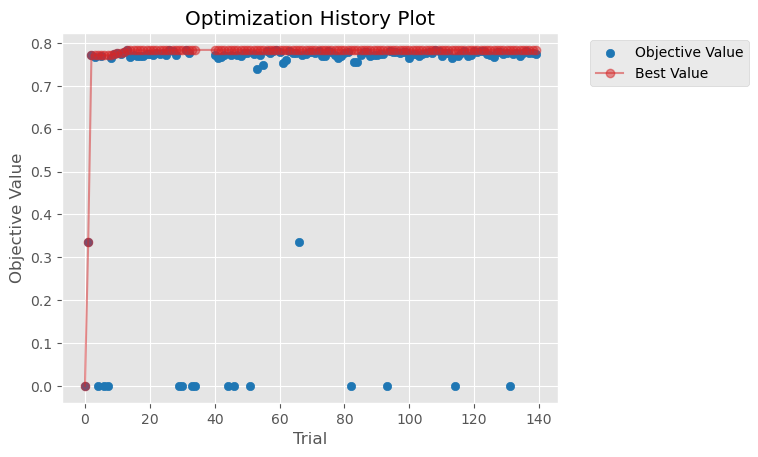

In [36]:
plot_optimization_history(study)

# Answer: 
Dimensionality reduction is the process of reducing the number of features in a dataset by selecting a subset of the most relevant features. It is often used as a preprocessing step before fitting a machine learning model, as it can help to reduce the computational cost of training the model and can also improve the model's performance by reducing the noise or redundancy in the data.

There are several techniques for dimensionality reduction, including:

- Principal Component Analysis (PCA): PCA is a linear dimensionality reduction technique that projects the data onto a lower-dimensional space by finding the directions (principal components) in which the data varies the most.

- Linear Discriminant Analysis (LDA) is a dimensionality reduction technique that is used for classification tasks. It is a supervised learning method that projects the data onto a lower-dimensional space by maximizing the class separability. LDA is based on the assumption that the data within each class follows a Gaussian distribution and that the classes have equal covariance matrices.

The main difference between LDA and PCA is that LDA is a supervised technique that takes into account the class labels of the data points, whereas PCA is an unsupervised technique that does not consider the class labels.

In this case, we can see that the accuracy is better with PCA than with LDA. We obtain a **0.77** accuracy with PCA and **0.76** accuracy with LDA.



# 9.7 Full experiments with DenseSift

In [37]:
def full_experiments(trial):
    try:
        search_metric = "balanced_accuracy"
        cv_strategy = cv_strategies["stratified"](n_splits=10)
        n_features = int(trial.suggest_int("n_features", 100, 300))
        step_size = int(trial.suggest_int("step_size", 2, 75))
        patch_size = int(trial.suggest_int("patch_size", 1, 3))
        _clusters = int(trial.suggest_categorical("n_clusters", [64, 128, 256, 512, 1024]))
        n_neighbors = int(trial.suggest_int("n_neighbors", 1, 20))
        metric = trial.suggest_categorical(
            "metric", ["euclidean", "manhattan", "chebyshev", "minkowski"]
        )
        n_components = int(trial.suggest_int("n_components", 1, 100))

        DESCRIPTOR = feature_extractors["DenseSIFT"](
            n_features=n_features, step_size=step_size, patch_size=patch_size
        )

        train_descriptors, train_labels_descrip = extract_features(
            train_images_filenames, train_labels, DESCRIPTOR
        )
        test_descriptors, test_labels_descrip = extract_features(
            test_images_filenames, test_labels, DESCRIPTOR
        )

        dimensionality_reduction = trial.suggest_categorical(
            "dimensionality_reduction", ["None", "PCA", "LDA"]
        )

        clustering = partial(cluster_local_features, n_clusters=_clusters)
        dim_reduction_type = dim_reduction[dimensionality_reduction](n_components=n_components)
        classifier = classifiers["KNN"](n_neighbors=n_neighbors, n_jobs=8, metric=metric)

        ex_trainer = BoVWClassifier(clustering, classifier, dim_reduction_type)
        ex_cv = FastCrossValidator(
            cv_strategy, search_metric, ex_trainer, np.unique(train_labels_descrip)
        )
        ex_metrics = ex_cv.cross_validate(train_descriptors, train_labels_descrip, n_jobs=8)

        return ex_metrics.mean()
    except:
        return 0


# random, grid search all of you want sampler https://optuna.readthedocs.io/en/stable/reference/samplers/index.html
sampler = TPESampler(seed=42)
try:
    study = optuna.load_study(study_name="full_experiments", storage="sqlite:///bbdd.db")
except:
    study = optuna.create_study(
        study_name="full_experiments",
        direction="maximize",
        sampler=sampler,
        storage="sqlite:///bbdd.db",
        load_if_exists=True,
    )
    study.optimize(full_experiments, n_trials=100, n_jobs=8, gc_after_trial=True)

df = study.trials_dataframe()
df.to_csv("compare_dimensionality.csv")
trial = study.best_trial

print("Accuracy: {}".format(trial.value))
print("Best hyperparameters: {}".format(trial.params))
gc.collect()

Accuracy: 0.7993374248360292
Best hyperparameters: {'dimensionality_reduction': 'PCA', 'metric': 'manhattan', 'n_clusters': 1024, 'n_components': 46, 'n_features': 251, 'n_neighbors': 18, 'patch_size': 3, 'step_size': 75}


3519

# 10. Test data evaluation <a name="test"></a>

Now we will evaluate the best model with the test dataset. 
After analyzing all the questions, we launched a full experiment. We ran both results and we got better results from the hyperparameters of full experiments with dense sift.

The best parameters found for the classifier in our grid search were:
- DenseSIFT descriptor using a n_features = 251, patch_size = 3, step size = 75
- Clustering: number of clusters k = 1024
- Dimensionality reduction = PCA with n_components = 46
- Classifier: n_neighbors = 18, metric = 'euclidean'

In [38]:
# Best descriptor
DESCRIPTOR = feature_extractors["DenseSIFT"](n_features=251, patch_size=3, step_size=75)
train_descriptors, train_labels_descrip = extract_features(
    train_images_filenames, train_labels, DESCRIPTOR
)
test_descriptors, test_labels_descrip = extract_features(
    test_images_filenames, test_labels, DESCRIPTOR
)

In [39]:
# Best model
clustering = partial(cluster_local_features, n_clusters=1024)
dim_reduction_type = dim_reduction["PCA"](n_components=46)
classifier = classifiers["KNN"](n_neighbors=18, n_jobs=8, metric="euclidean")

In [40]:
# Train the model and compute the time
start = time.time()
ex_trainer = BoVWClassifier(clustering, classifier, dim_reduction_type)
ex_trainer.fit(train_descriptors, train_labels_descrip)
end = time.time()
print("Training time: ", end - start)

Training time:  10.706504821777344


In [41]:
# Test the model and compute the time
start = time.time()
predictions = ex_trainer.predict(test_descriptors)
end = time.time()
print("Testing time: ", end - start)

Testing time:  0.14662933349609375


In [42]:
# Define a function to compute the f1-score and accuracy for each class
def compute_metrics(truth, preds):
    results = []
    unique_labels = np.unique(truth)
    truth, preds = np.array(truth), np.array(preds)
    for lab in unique_labels:
        acc = metrics["accuracy"](truth == lab, preds == lab)
        F1 = metrics["f1-score"](truth == lab, preds == lab)
        results.append((lab, acc, F1))

    overall_acc = metrics["balanced_accuracy"](truth, preds)
    weighted_F1 = metrics["f1-score"](truth, preds, average="weighted")
    results.append(("OVERALL", overall_acc, weighted_F1))
    return pd.DataFrame(data=results, columns=["label", "accuracy", "f1_score"])

In [43]:
# Evaluate the model using the f1-score, accuracy and confusion matrix
compute_metrics(test_labels_descrip, predictions)

,label,accuracy,f1_score
0,Opencountry,0.912020,0.687225
1,coast,0.925651,0.767442
2,forest,0.966543,0.877828
3,highway,0.951673,0.715328
4,inside_city,0.962825,0.836957
5,mountain,0.944238,0.792627
6,street,0.975217,0.868421
7,tallbuilding,0.957869,0.844037
8,OVERALL,0.796248,0.796536


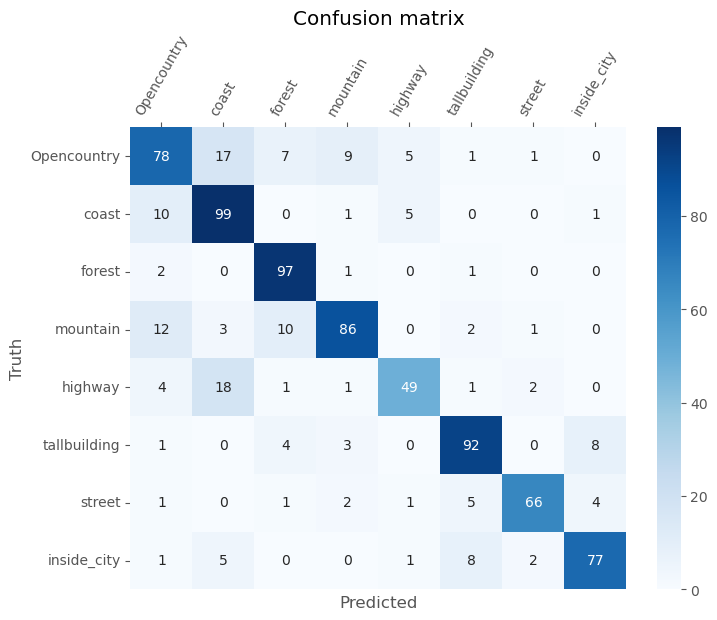

In [44]:
# Plot confusion matrix
labels = [
    "Opencountry",
    "coast",
    "forest",
    "mountain",
    "highway",
    "tallbuilding",
    "street",
    "inside_city",
]
confusion = confusion_matrix(test_labels_descrip, predictions, labels=labels)

fig = plt.figure(figsize=(8, 6))
g = sns.heatmap(
    confusion, cbar=True, annot=True, cmap="Blues"
)  # , xticklabels=labels, yticklabels=labels,)
g.set_title("Confusion matrix")

g.set_ylabel("Truth")
g.set_xlabel("Predicted")
g.set_yticklabels(labels, rotation=0)
g.set_xticklabels(labels, rotation=60)
g.xaxis.tick_top()

plt.show()

/tmp/ipykernel_30865/641898984.py:4: RuntimeWarning: invalid value encountered in divide
  f_score = np.nan_to_num((2 * (precision * recall) / (precision + recall)))


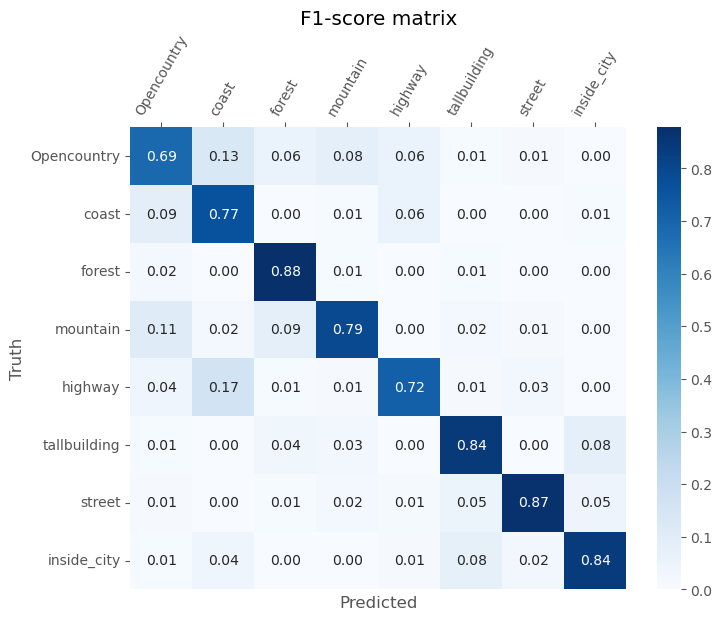

In [45]:
# Plot fscore matrix
precision = confusion / confusion.sum(axis=0)
recall = ((confusion.T) / (confusion.sum(axis=1))).T
f_score = np.nan_to_num((2 * (precision * recall) / (precision + recall)))

fig = plt.figure(figsize=(8, 6))
g = sns.heatmap(
    f_score, cmap="Blues", annot=True, fmt=".2f", xticklabels=labels, yticklabels=labels
)
g.set_title("F1-score matrix")

g.set_ylabel("Truth")
g.set_xlabel("Predicted")
g.set_yticklabels(labels, rotation=0)
g.set_xticklabels(labels, rotation=60)
g.xaxis.tick_top()

plt.show()

In [46]:
# Function to get the false positives inside a class
def get_false_positives(truth, preds, clas):
    truth, preds = np.array(truth), np.array(preds)
    return np.where((truth != clas) & (preds == clas))

In [47]:
# Function to plot all the false positives images of a class
def plot_false_positives(truth, preds, idxs, test_images_filenames):
    total = len(idxs[0])
    COLS = 5
    rows, cols = max(2, total // COLS + 1), COLS
    fig, axs = plt.subplots(rows, cols, figsize=(30, 3 * rows))

    for i in range(rows * cols):
        r, c = i // cols, i % cols
        if i >= total:
            fig.delaxes(axs[r, c])
            continue
        img = cv2.imread(test_images_filenames[idxs[0][i]])
        axs[r, c].set_title(f"{idxs[0][i]}\n{truth[idxs[0][i]]}")
        axs[r, c].axis("off")
        axs[r, c].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

> Wrongly predicted as Opencountry



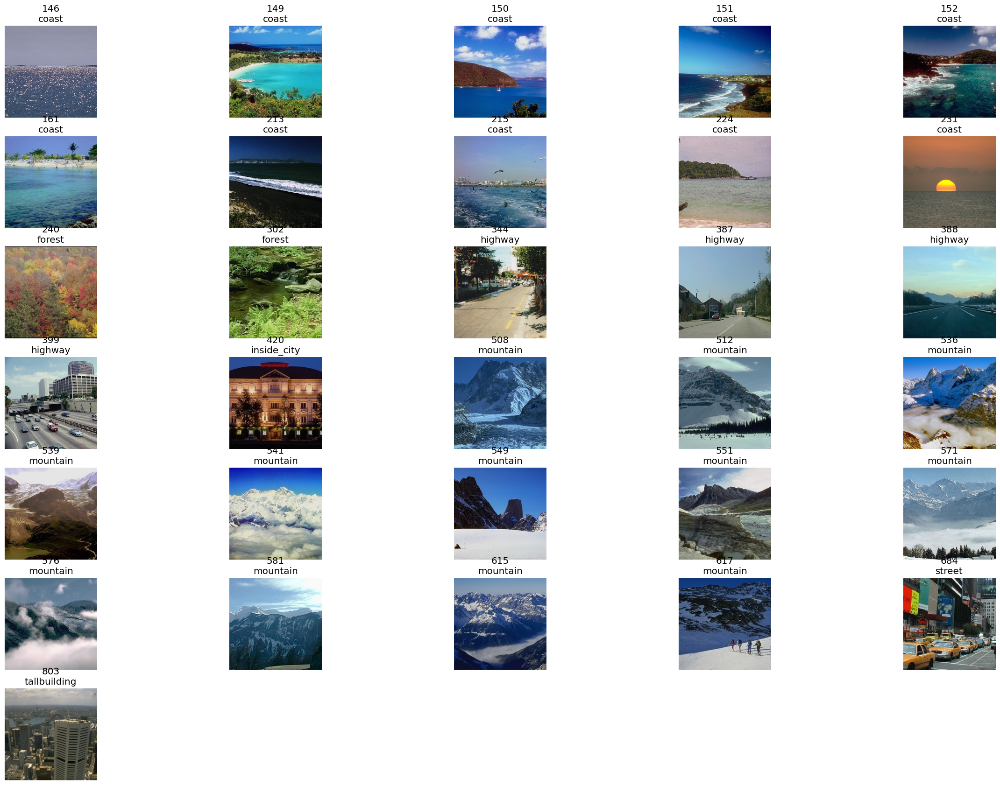

> Wrongly predicted as coast



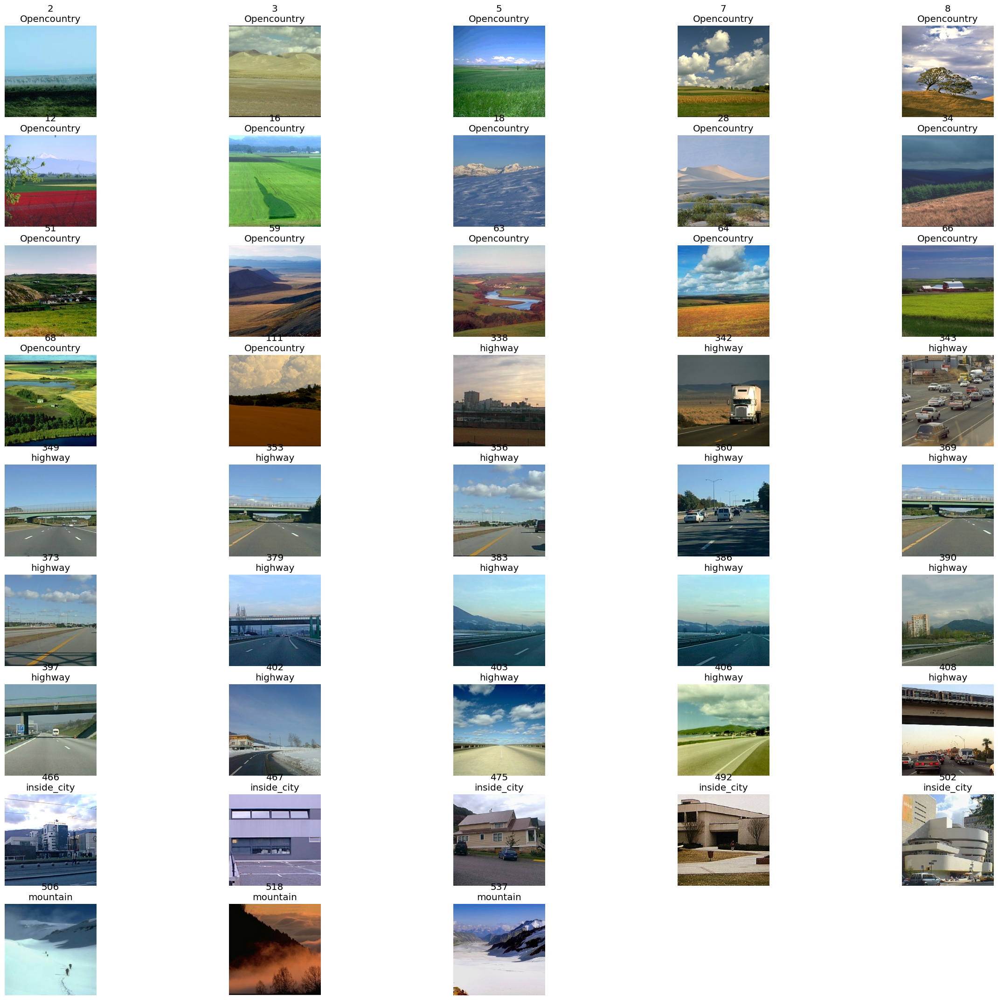

> Wrongly predicted as forest



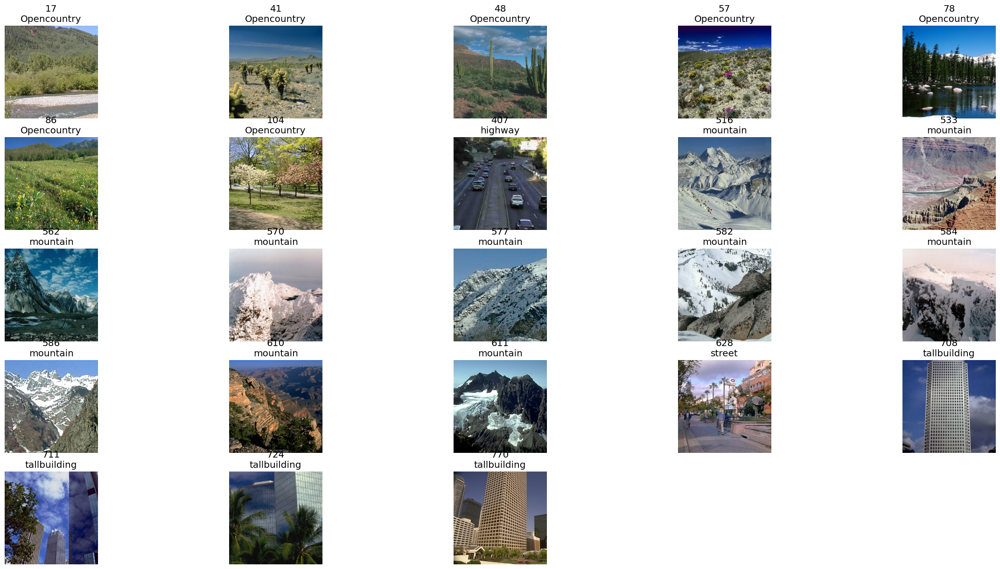

> Wrongly predicted as mountain



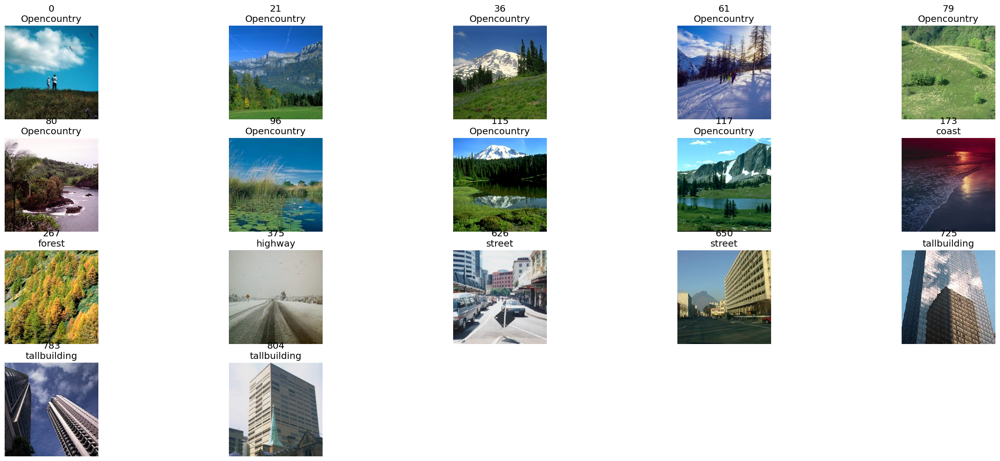

> Wrongly predicted as highway



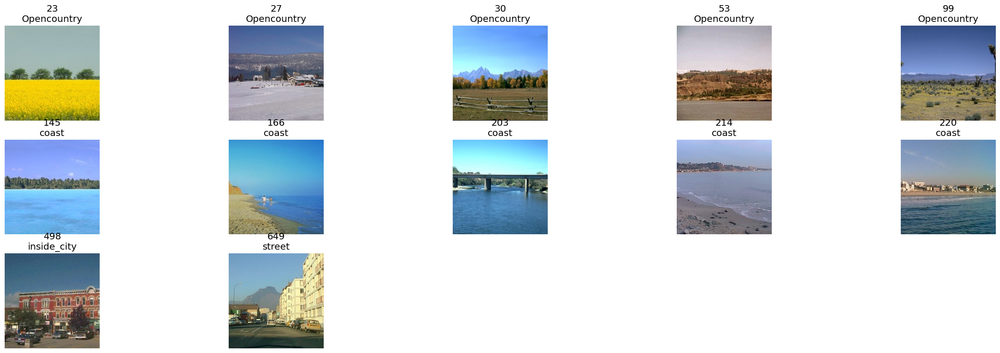

> Wrongly predicted as tallbuilding



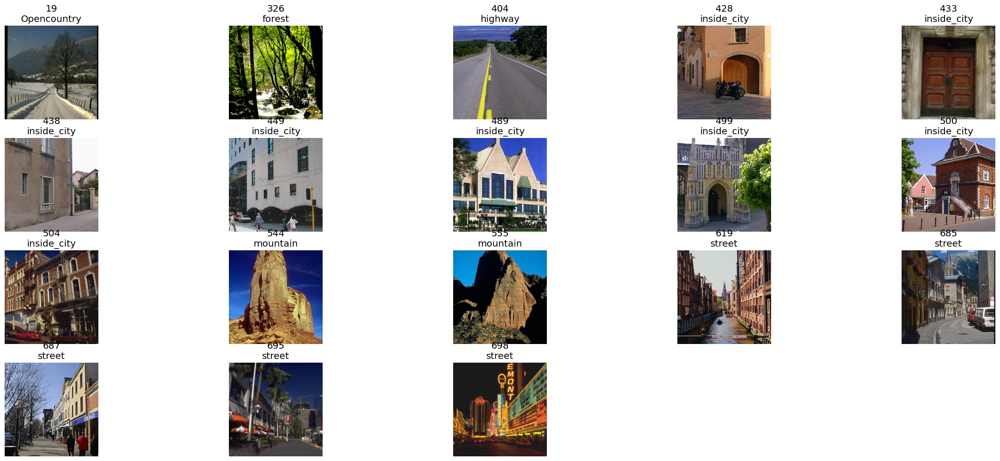

> Wrongly predicted as street



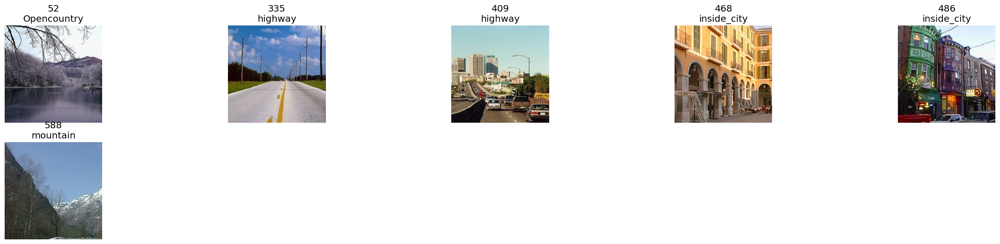

> Wrongly predicted as inside_city



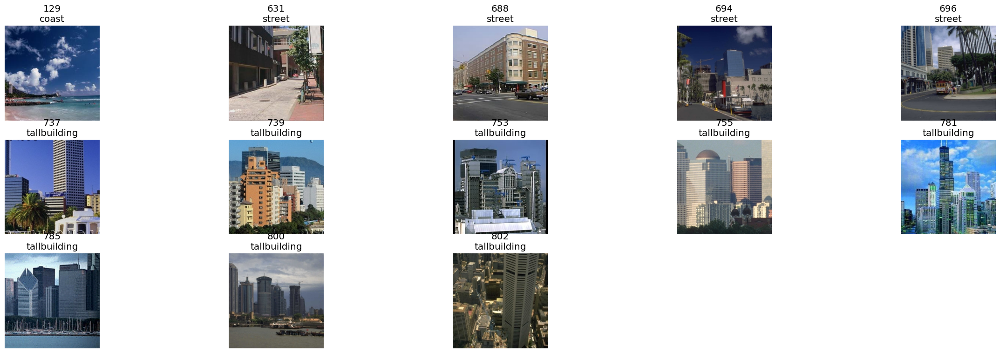

In [48]:
for lab in labels:
    print(f"> Wrongly predicted as {lab}\n")
    plot_false_positives(
        test_labels_descrip,
        predictions,
        get_false_positives(test_labels_descrip, predictions, lab),
        test_images_filenames,
    )

# Answer:
The Visual Bag of Words (VBOW) model is a machine learning approach that has been shown to achieve good performance on image classification and retrieval tasks. By representing images as a bag of visual words, the VBOW model can effectively capture the visual content of an image and use this information to make predictions.

In order to optimize the performance of a VBOW model, it is important to carefully select and tune the hyperparameters. This can be achieved through techniques such as cross-validation and grid search. By optimizing the hyperparameters, it is possible to improve the accuracy and f1-score of the VBOW model. In this case, the VBOW model was able to achieve an accuracy of 0.7962 and an f1-score of 0.796536, indicating good performance.

Overall, the VBOW model is a useful tool for image classification and retrieval tasks, and careful hyperparameter optimization can significantly improve its performance.